There are two main parts to this problem:
- Detecting the logo.
- Removing the logo and inpainting its place.

Starting with the detection part, this can be solved using multiple approaches:

1. SIFT
2. OCR
3. Training a customized Detection Model (YOLOv8)

For removing the logo part, there are multple options involving creating a mask and tring to inpaint using different functions. I tried:
- cv2.inpaint()
- thresholding to erase the logo and then filling with an avrage value then smoothening by applying blurring filter.


### Imports and installations

In [2]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math
from PIL import Image
import os

### Helper Functions

In [8]:
def midpoint(x0, y0, x1, y1):
    return (int((x0 + x1) / 2), int((y0 + y1) / 2))

In [9]:
def display_image(img, cmap = None):
  plt.imshow(img, cmap=cmap)
  plt.axis('off')
  plt.show()

### OCR Experiments

I first tried the exiting options for logo detection in IDs before training a custom model so I went for exisiting OCR Models and I tried multiples but there were two wih acceptable performance:
- kares_ocr: it worked well on detected text but it is not trained on arabic language so it did not actually recognize the right words but detected their approximate locations and this was the motivation to look for an Arabic OCR.
- Arabic OCR: this model is trained on arabc language so it performed better but were not able to detect the sentence itself correctly, just the location and most of the arabic letters in the sentenec of interset but it was actually good so with smoothing and ordering the results, we can work on the first two bounding boes to get a nice bounding box that encapsulates the whole logo. But the probem that arised with this solution occured when the ID card was tilted, cause the bounding box would be straight and this resulted in a problem with the impaing part. So, this motivated looking for a better detector after ensuring that there is a working pipeline.

#### Kares OCR

In [ ]:
!pip install keras_ocr

In [ ]:
import keras_ocr

In [ ]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:
def inpaint_text(img_path, pipeline):

    img = keras_ocr.tools.read(img_path)
    # generate (word, box) tuples
    prediction_groups = pipeline.recognize([img])
    mask = np.zeros(img.shape[:2], dtype="uint8")

    for box in prediction_groups[0]:
        x0, y0 = box[1][0]
        x1, y1 = box[1][1]
        x2, y2 = box[1][2]
        x3, y3 = box[1][3]

        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mid1 = midpoint(x0, y0, x3, y3)
        thickness = int(math.sqrt((x2 - x1)**2 + (y2 - y1)**2))

        cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mid1), 255, thickness)
        img = cv2.inpaint(img, mask, 7, cv2.INPAINT_NS)

    return img


1/1 [==============================] - 15s 15s/step


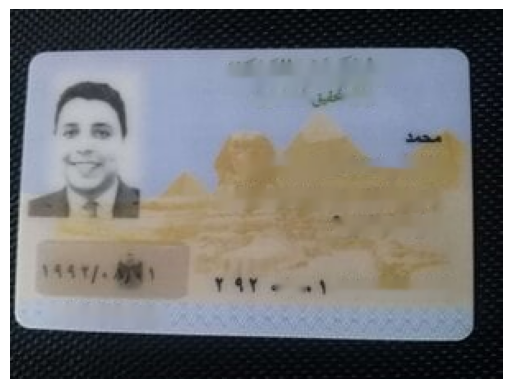

1/1 [==============================] - 7s 7s/step


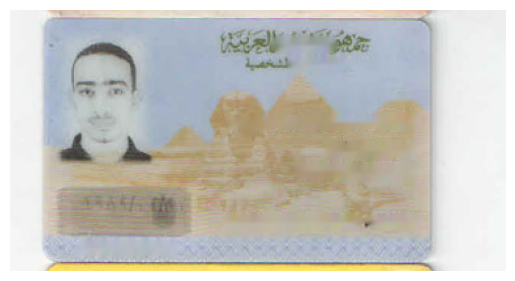

1/1 [==============================] - 5s 5s/step


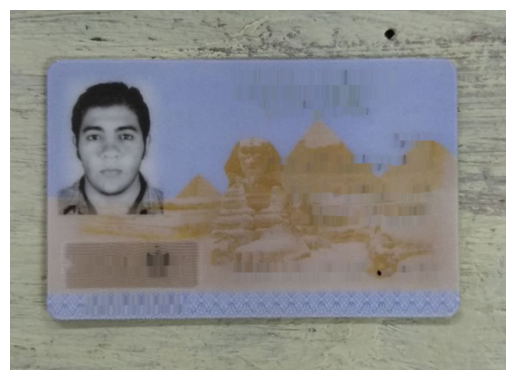

1/1 [==============================] - 7s 7s/step


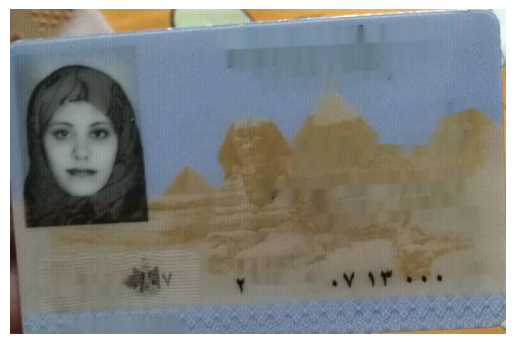

1/1 [==============================] - 4s 4s/step


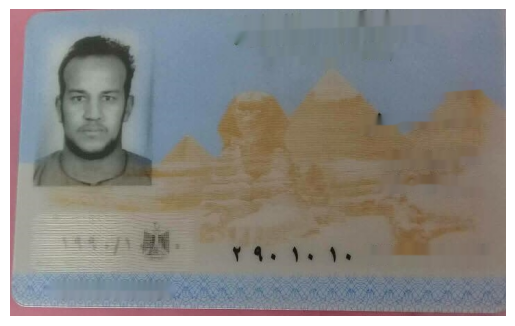

1/1 [==============================] - 3s 3s/step


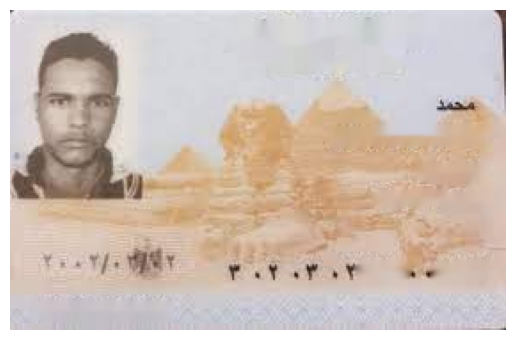

1/1 [==============================] - 5s 5s/step


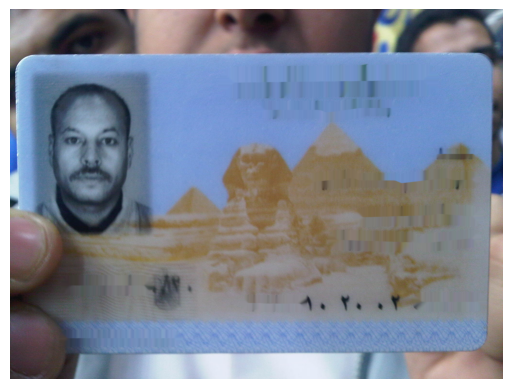

1/1 [==============================] - 6s 6s/step


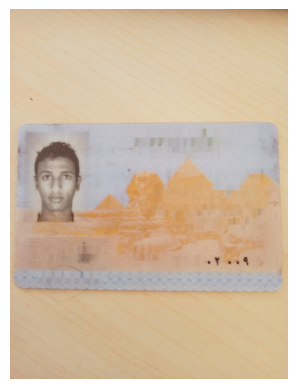

1/1 [==============================] - 5s 5s/step


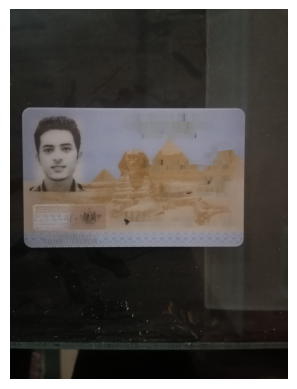

In [ ]:
folder = '/content/input'
for item in os.listdir(folder):
    full_path = os.path.join(folder, item)
    if os.path.isfile(full_path):
      img = inpaint_text(full_path , pipeline)
      display_image(img)


Notes:
- We can modify the function to remove only the green text at the top, but this would require some function manipulation. This could involve sorting the results according to the y-axis and choosing the bounding boxes that correspond to the logo at the top. However, given the results of this OCR and the fact that it doesn't recognize Arabic letters, I preferred trying another OCR engine first and comparing the quality of the outputs.

###[ Arabic OCR ](https://khandelwal-shekhar.medium.com/arabicocr-amazing-ocr-library-for-arabic-pdf-documents-5d736e97904b)

In [5]:
!pip install ArabicOcr

In [6]:
from ArabicOcr import arabicocr

[INFO] OCR'ing input image...
[INFO] 0.0993: آمش9ليم جما
[INFO] 0.1396: طالا علب ,
[INFO] 0.1842: قحى بسيدنى
[INFO] 0.1745: ذ١ نن اللينى مننر المعب الدينى
[INFO] 0.1034: البتبرة
[INFO] 0.2784: دمنهرر
[INFO] 0.1468: ٧٧ ١١
[INFO] 0.5996: 1/0753896


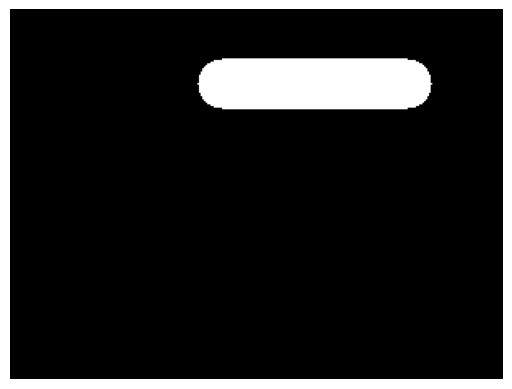

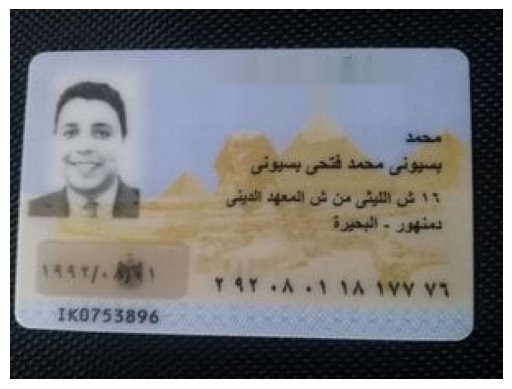

[INFO] OCR'ing input image...
[INFO] 0.0391: همهوزنذفصرالع بينما
[INFO] 0.1307: اطالا خند
[INFO] 0.6666: عبدالر
[INFO] 0.2222: كمر عنان زانر
[INFO] 0.4409: مركز زفتى  اللزببة
[INFO] 0.3034: ٩ ٢ ٢ ٣
[INFO] 0.7277: ٤68748359


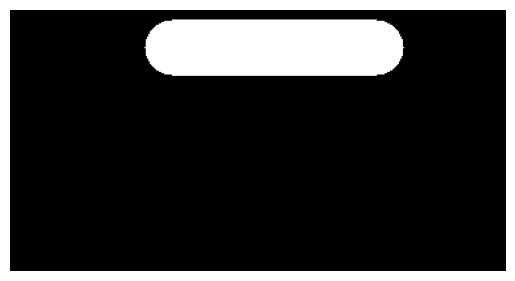

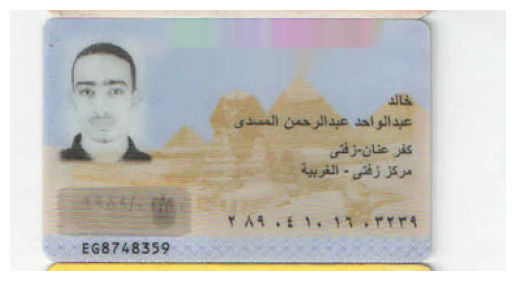

[INFO] OCR'ing input image...
[INFO] 0.2015: جمهورتذف صزالح بينا
[INFO] 0.9027: الشخصية
[INFO] 0.8070: بطاقة
[INFO] 0.9253: محمود
[INFO] 0.6756: محمد
[INFO] 0.6668: عبدالعزيز قطب
[INFO] 0.7693: الحكماء
[INFO] 0.7562: عبدالقادر
[INFO] 0.4069: ٩ ش
[INFO] 0.9988: الشرقية
[INFO] 0.8911: الزقازيق
[INFO] 0.1303: ٣٧٩؛ ٩٨٩١٠ ١
[INFO] 0.9955: ٨٩ ٢
[INFO] 0.7420: ١٣ ٠٩ ٠٩
[INFO] 0.8137: ٩٥ ٠٥
[INFO] 0.9825: 6$6787688
[INFO] 0.8802: تحقيق
[INFO] 0.7110: عصام
[INFO] 0.9808: ثان


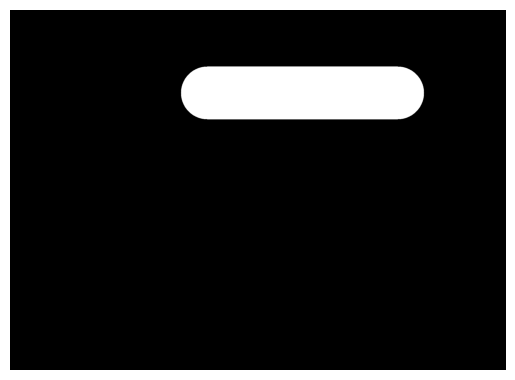

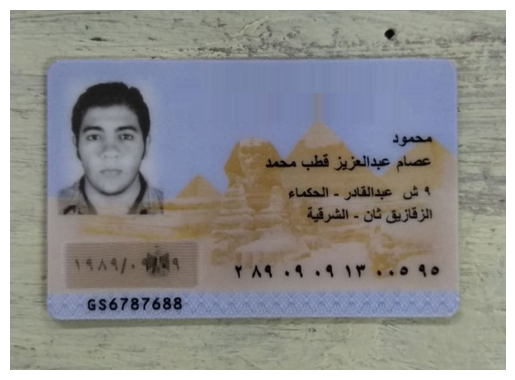

[INFO] OCR'ing input image...
[INFO] 0.0786: جمهوزنذهالع نبينما
[INFO] 0.0933: بااقآة
[INFO] 0.0061: لر
[INFO] 0.0023: قت
[INFO] 0.7935: همام
[INFO] 0.0493: يزسذ
[INFO] 0.7864: اش باب الشعرية
[INFO] 0.6295: الشرقية
[INFO] 0.9463: ثان
[INFO] 0.3706: ٠ ١ ٤ ٩ ٩ ١
[INFO] 0.0068: والكرء
[INFO] 0.1353: <110844395
[INFO] 0.1552: اتحقيق
[INFO] 0.1401: التمته بة
[INFO] 0.9578: السيد
[INFO] 0.7246: شىعبان
[INFO] 0.7113: الزقازيق


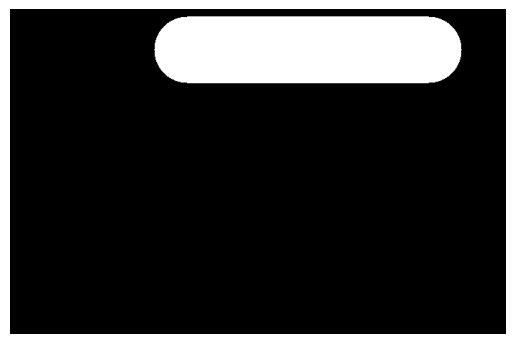

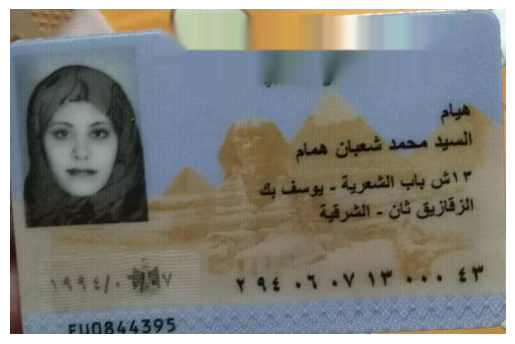

[INFO] OCR'ing input image...
[INFO] 0.0863: جمهوزئزقضزالح :
[INFO] 0.3228: الشخصية
[INFO] 0.2782: ابطاقة
[INFO] 0.0234: حا
[INFO] 0.2837: مدمد
[INFO] 0.8540: خالا
[INFO] 0.6595: كلا حين
[INFO] 0.7342: قنا
[INFO] 0.4008: مركز قنا
[INFO] 0.4717: ٢ ٥ ٦ ١ ٠
[INFO] 0.7931: 6"1346493
[INFO] 0.6163:  تحقيق
[INFO] 0.9744: ابنود


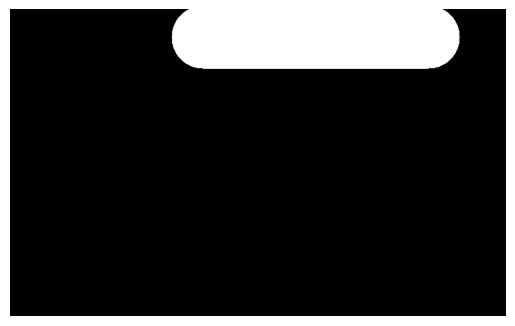

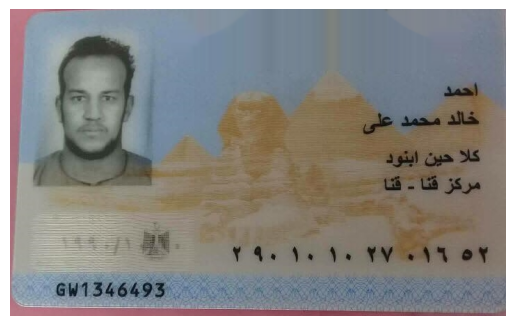

[INFO] OCR'ing input image...
[INFO] 0.0155: ل8 وزرز عبم ٦
[INFO] 0.1088: طاقتغتز
[INFO] 0.2750: أبراهيم على
[INFO] 0.1873: انبران
[INFO] 0.2110: مركز قنط - تا
[INFO] 0.6662: HK3077534


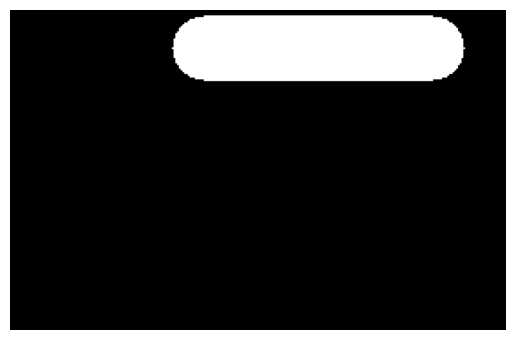

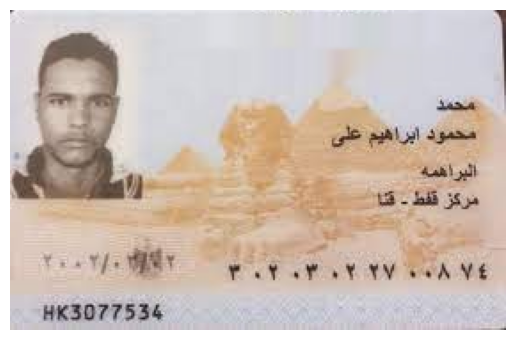

[INFO] OCR'ing input image...
[INFO] 0.0405: جمهوزنذف صم الع بينما
[INFO] 0.1525: الشحصية
[INFO] 0.3496: رطاؤة
[INFO] 0.9023: محمد السيد
[INFO] 0.4927: عبل
[INFO] 0.6475: عزبة المهاجرين
[INFO] 0.8557: الاسكندرية
[INFO] 0.7550: المنتزه
[INFO] 0.3433: ٩٧٠/١
[INFO] 0.9322: ٧
[INFO] 0.6504: ٧١ ٢٠
[INFO] 0.2152: 5865?5226
[INFO] 0.1674: نحقبق
[INFO] 0.9930: المنعم


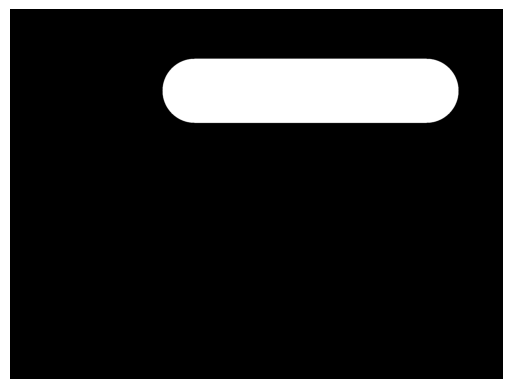

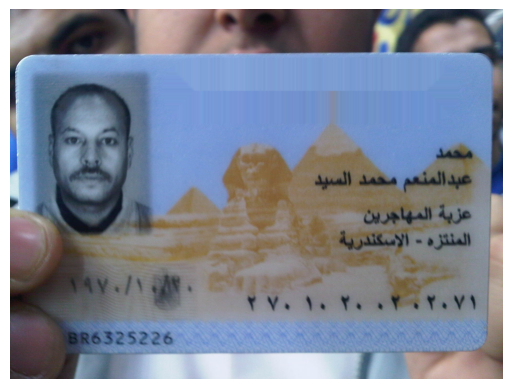

[INFO] OCR'ing input image...
[INFO] 0.0794: جمهوائذفوصنالح بينا
[INFO] 0.9519: الشخصية
[INFO] 0.9979: بطاقة
[INFO] 0.3070: احمد
[INFO] 0.5705: حسن شاهين
[INFO] 0.4785: حسين عواض
[INFO] 0.4149: الفولى من بن واصل
[INFO] 0.8458: و
[INFO] 0.8646: نهاية
[INFO] 0.7541: الاسكندرية
[INFO] 0.8777: ثان الرمل
[INFO] 0.4827: ٤٢١٨ ٢١٠ ٩ ٩ ١
[INFO] 0.9674: ٠٤ ٩٢ ٢
[INFO] 0.9851: ٩٥ ٩
[INFO] 0.9145: 615596410
[INFO] 0.7585: تحقيق
[INFO] 0.9980: ابور


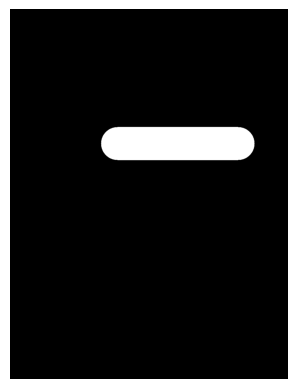

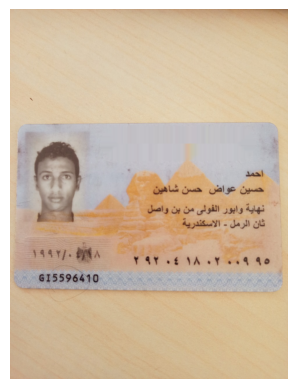

[INFO] OCR'ing input image...
[INFO] 0.0667: جمهوذتينزف صزالح بيننا
[INFO] 0.9549: الشخصية
[INFO] 0.9996: بطاقة
[INFO] 0.9358: الله
[INFO] 0.7456: محمد ابرا هيم
[INFO] 0.9050: القلج البلد
[INFO] 0.5661: القليوبية
[INFO] 0.6939: مركز الخانكه
[INFO] 0.7664: ٩٨ ٢
[INFO] 0.7522: ٨٨ ٠٣ ٠٧
[INFO] 0.9999: ٧٨
[INFO] 0.4833: |A5778064
[INFO] 0.2936: تحقيق
[INFO] 0.9834: مصطفى
[INFO] 0.9049: فتح
[INFO] 0.9990: ابراهيم


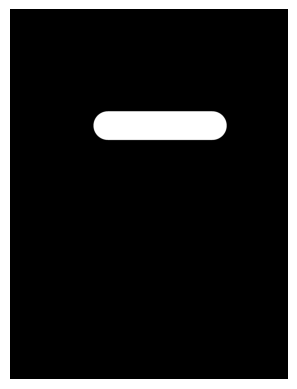

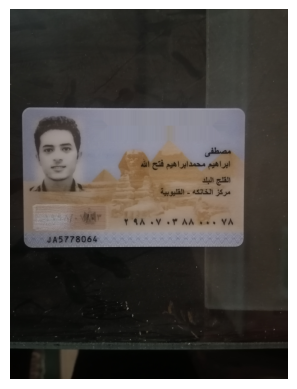

In [7]:
folder = "/content/input"

for item in os.listdir(folder):
    full_path = os.path.join(folder, item)
    if os.path.isfile(full_path):
        results=arabicocr.arabic_ocr(full_path,'out.jpg')
        points = results[0][0]

        # Extract the second and third points -- those are the two boxes corresponding to the top most text: the desrired logo
        second_point = results[0][0][1]
        third_point = results[1][0][2]

        # Calculate vertical distance between the second and third points
        vertical_distance = abs(third_point[1] - second_point[1])

        # Calculate coordinates for the top-left and bottom-right corners of the bounding box
        x0, y0 = (math.ceil(second_point[0] - 4 * vertical_distance), second_point[1])
        x2, y2  = (second_point[0] , third_point[1])
        x1, y1 = second_point
        x3, y3 = (x0,y2)

        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)


        image = cv2.imread(full_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = np.zeros(image.shape[:2], dtype="uint8")

        thickness = int(math.sqrt( (x2 - x1)**2 + (y2 - y1)**2) + math.sqrt( (x2 - x1)**2 + (y2 - y1)**2) * 0.1)
        cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mi1), 255, thickness)
        display_image(mask, 'gray')

        image = cv2.inpaint(image, mask, 7, cv2.INPAINT_NS)
        display_image(image)


- From the results above, the quality of inpainint would be affected if the Card was tilted so to try to solve this we can either try to rotate the card or to try different inpaining algorithm.
- I tried an algorithm that used orientation of detcted text to idetify the angle of rotation but it did not perform well. The better option would to actually detect the orientation of the image and use it to get an angle to be used for rotating the image. I was going to work on this model but I tried SIFT and it addressed this issue quite effectivly.


#### Notes:
- I tried using grayscale images and applying thresholding to see if this would improve the OCR output. However, thresholding didn't work because some of the images were too light, resulting in the removal of most of the ID content. Applying grayscale also didn't improve the OCR output.

- I tried [`pyinpaint`](https://github.com/aGIToz/PyInpaint) but it actually didn't work and was slow.

In [ ]:
! pip install pyinpaint

In [9]:
from pyinpaint import Inpaint

15.jpg
[INFO] OCR'ing input image...
[INFO] 0.0993: آمش9ليم جما
[INFO] 0.1396: طالا علب ,
[INFO] 0.1842: قحى بسيدنى
[INFO] 0.1745: ذ١ نن اللينى مننر المعب الدينى
[INFO] 0.1034: البتبرة
[INFO] 0.2784: دمنهرر
[INFO] 0.1468: ٧٧ ١١
[INFO] 0.5996: 1/0753896


# of pixels to be inpainted are 28: 100%|██████████|28/28


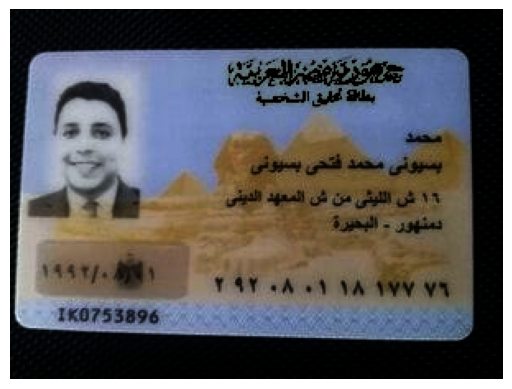

48.jpg
[INFO] OCR'ing input image...
[INFO] 0.0391: همهوزنذفصرالع بينما
[INFO] 0.1307: اطالا خند
[INFO] 0.6666: عبدالر
[INFO] 0.2222: كمر عنان زانر
[INFO] 0.4409: مركز زفتى  اللزببة
[INFO] 0.3034: ٩ ٢ ٢ ٣
[INFO] 0.7277: ٤68748359


# of pixels to be inpainted are 49: 100%|██████████|49/49


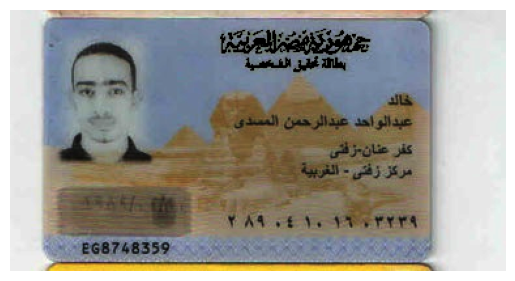

55.jpg
[INFO] OCR'ing input image...
[INFO] 0.2015: جمهورتذف صزالح بينا
[INFO] 0.9027: الشخصية
[INFO] 0.8070: بطاقة
[INFO] 0.9253: محمود
[INFO] 0.6756: محمد
[INFO] 0.6668: عبدالعزيز قطب
[INFO] 0.7693: الحكماء
[INFO] 0.7562: عبدالقادر
[INFO] 0.4069: ٩ ش
[INFO] 0.9988: الشرقية
[INFO] 0.8911: الزقازيق
[INFO] 0.1303: ٣٧٩؛ ٩٨٩١٠ ١
[INFO] 0.9955: ٨٩ ٢
[INFO] 0.7420: ١٣ ٠٩ ٠٩
[INFO] 0.8137: ٩٥ ٠٥
[INFO] 0.9825: 6$6787688
[INFO] 0.8802: تحقيق
[INFO] 0.7110: عصام
[INFO] 0.9808: ثان


# of pixels to be inpainted are 6504: 100%|██████████|6504/6504


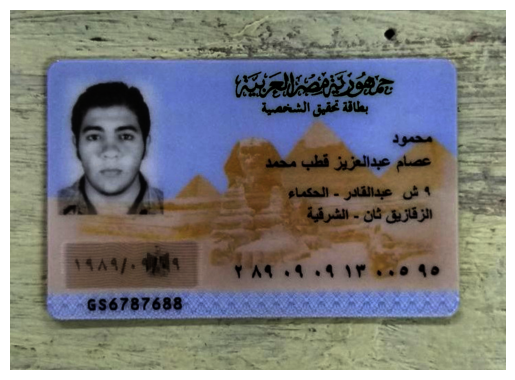

51.jpg
[INFO] OCR'ing input image...
[INFO] 0.0786: جمهوزنذهالع نبينما
[INFO] 0.0933: بااقآة
[INFO] 0.0061: لر
[INFO] 0.0023: قت
[INFO] 0.7935: همام
[INFO] 0.0493: يزسذ
[INFO] 0.7864: اش باب الشعرية
[INFO] 0.6295: الشرقية
[INFO] 0.9463: ثان
[INFO] 0.3706: ٠ ١ ٤ ٩ ٩ ١
[INFO] 0.0068: والكرء
[INFO] 0.1353: <110844395
[INFO] 0.1552: اتحقيق
[INFO] 0.1401: التمته بة
[INFO] 0.9578: السيد
[INFO] 0.7246: شىعبان
[INFO] 0.7113: الزقازيق


# of pixels to be inpainted are 520: 100%|██████████|520/520


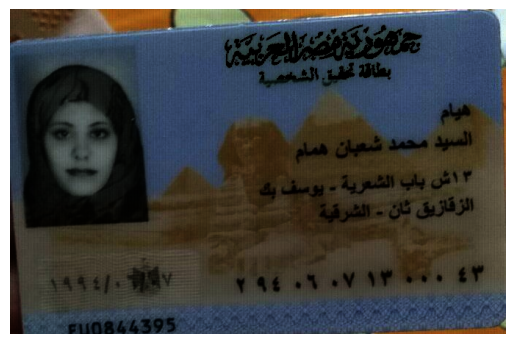

2.jpg
[INFO] OCR'ing input image...
[INFO] 0.0863: جمهوزئزقضزالح :
[INFO] 0.3228: الشخصية
[INFO] 0.2782: ابطاقة
[INFO] 0.0234: حا
[INFO] 0.2837: مدمد
[INFO] 0.8540: خالا
[INFO] 0.6595: كلا حين
[INFO] 0.7342: قنا
[INFO] 0.4008: مركز قنا
[INFO] 0.4717: ٢ ٥ ٦ ١ ٠
[INFO] 0.7931: 6"1346493
[INFO] 0.6163:  تحقيق
[INFO] 0.9744: ابنود


# of pixels to be inpainted are 382: 100%|██████████|382/382


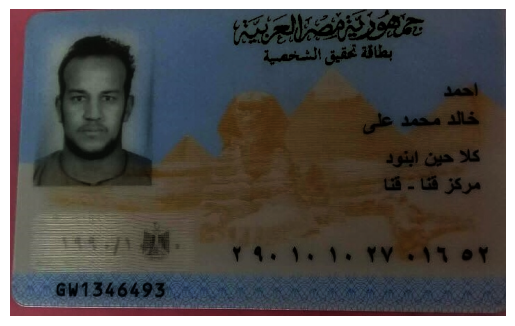

21.jpg
[INFO] OCR'ing input image...
[INFO] 0.0155: ل8 وزرز عبم ٦
[INFO] 0.1088: طاقتغتز
[INFO] 0.2750: أبراهيم على
[INFO] 0.1873: انبران
[INFO] 0.2110: مركز قنط - تا
[INFO] 0.6662: HK3077534


# of pixels to be inpainted are 109: 100%|██████████|109/109


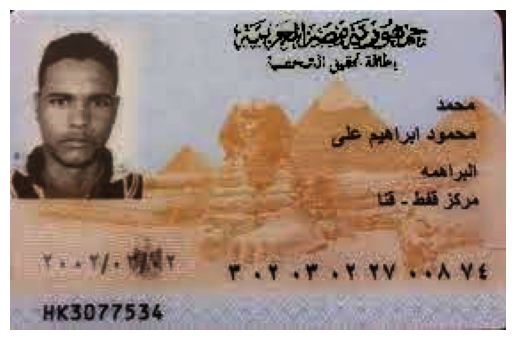

9.jpg
[INFO] OCR'ing input image...
[INFO] 0.0405: جمهوزنذف صم الع بينما
[INFO] 0.1525: الشحصية
[INFO] 0.3496: رطاؤة
[INFO] 0.9023: محمد السيد
[INFO] 0.4927: عبل
[INFO] 0.6475: عزبة المهاجرين
[INFO] 0.8557: الاسكندرية
[INFO] 0.7550: المنتزه
[INFO] 0.3433: ٩٧٠/١
[INFO] 0.9322: ٧
[INFO] 0.6504: ٧١ ٢٠
[INFO] 0.2152: 5865?5226
[INFO] 0.1674: نحقبق
[INFO] 0.9930: المنعم


# of pixels to be inpainted are 15574: 100%|██████████|15574/15574


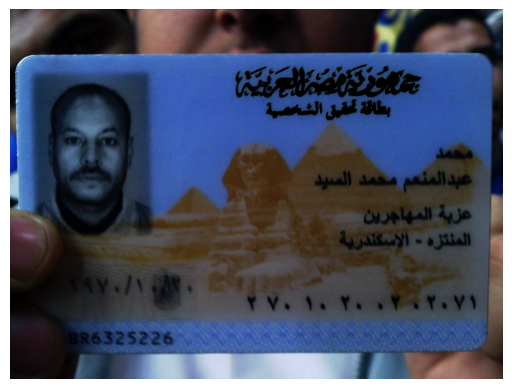

52.jpg
[INFO] OCR'ing input image...
[INFO] 0.0794: جمهوائذفوصنالح بينا
[INFO] 0.9519: الشخصية
[INFO] 0.9979: بطاقة
[INFO] 0.3070: احمد
[INFO] 0.5705: حسن شاهين
[INFO] 0.4785: حسين عواض
[INFO] 0.4149: الفولى من بن واصل
[INFO] 0.8458: و
[INFO] 0.8646: نهاية
[INFO] 0.7541: الاسكندرية
[INFO] 0.8777: ثان الرمل
[INFO] 0.4827: ٤٢١٨ ٢١٠ ٩ ٩ ١
[INFO] 0.9674: ٠٤ ٩٢ ٢
[INFO] 0.9851: ٩٥ ٩
[INFO] 0.9145: 615596410
[INFO] 0.7585: تحقيق
[INFO] 0.9980: ابور


# of pixels to be inpainted are 830: 100%|██████████|830/830


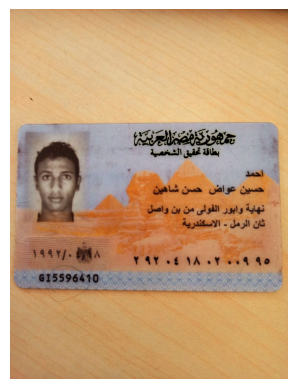

44.jpg


[INFO] OCR'ing input image...
[INFO] 0.0667: جمهوذتينزف صزالح بيننا
[INFO] 0.9549: الشخصية
[INFO] 0.9996: بطاقة
[INFO] 0.9358: الله
[INFO] 0.7456: محمد ابرا هيم
[INFO] 0.9050: القلج البلد
[INFO] 0.5661: القليوبية
[INFO] 0.6939: مركز الخانكه
[INFO] 0.7664: ٩٨ ٢
[INFO] 0.7522: ٨٨ ٠٣ ٠٧
[INFO] 0.9999: ٧٨
[INFO] 0.4833: |A5778064
[INFO] 0.2936: تحقيق
[INFO] 0.9834: مصطفى
[INFO] 0.9049: فتح
[INFO] 0.9990: ابراهيم


# of pixels to be inpainted are 39477:   0%|          |0/39477

In [ ]:
folder = "/content/input"

for item in os.listdir(folder):
    full_path = os.path.join(folder, item)
    if os.path.isfile(full_path):
        print(item)
        results = arabicocr.arabic_ocr(full_path, 'out.jpg')

        if len(results) < 2:
            continue  # Ensure there are at least two points

        points = results[0][0]
        second_point = points[1]
        third_point = results[1][0][2]

        vertical_distance = abs(third_point[1] - second_point[1])

        x0, y0 = (math.ceil(second_point[0] - 4 * vertical_distance), second_point[1])
        x2, y2 = (second_point[0], third_point[1])
        x1, y1 = second_point
        x3, y3 = (x0, y2)

        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mid1 = midpoint(x0, y0, x3, y3)

        image = cv2.imread(full_path)

        mask = image
        roi = image[y0:y2, x0:x2]
        grayImg = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        ret, thresh_img = cv2.threshold(grayImg, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

        mask_indices = np.where(thresh_img == 255)
        roi[mask_indices] = [0, 0, 0]
        mask[y0:y2, x0:x2] = roi

        intermediate_img_path = 'intermediate_img.jpg'
        cv2.imwrite(intermediate_img_path, image)
        mask_path = 'mask_img.jpg'
        cv2.imwrite(mask_path, mask)

        # Assuming Inpaint is a class you have defined for inpainting
        inpaint = Inpaint(intermediate_img_path, mask_path)
        inpainted_img = inpaint()

        plt.imshow(inpainted_img)
        plt.axis('off')
        plt.show()


- Trying thresholding with Arabic OCR output.  

[INFO] OCR'ing input image...
[INFO] 0.0993: آمش9ليم جما
[INFO] 0.1396: طالا علب ,
[INFO] 0.1842: قحى بسيدنى
[INFO] 0.1745: ذ١ نن اللينى مننر المعب الدينى
[INFO] 0.1034: البتبرة
[INFO] 0.2784: دمنهرر
[INFO] 0.1468: ٧٧ ١١
[INFO] 0.5996: 1/0753896


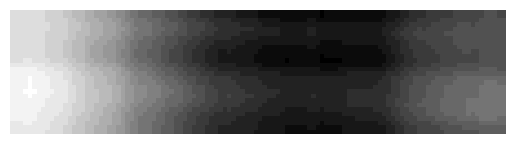

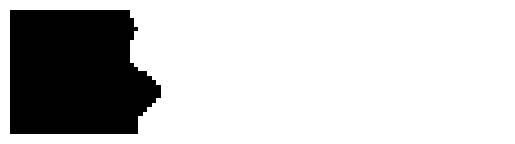

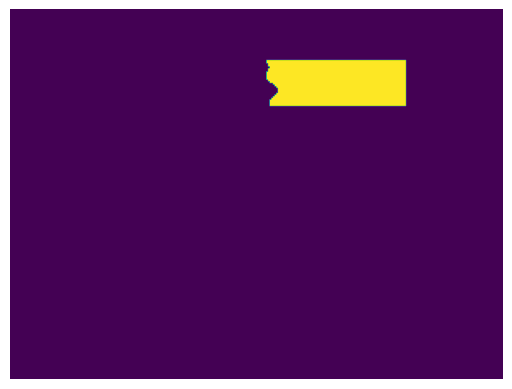

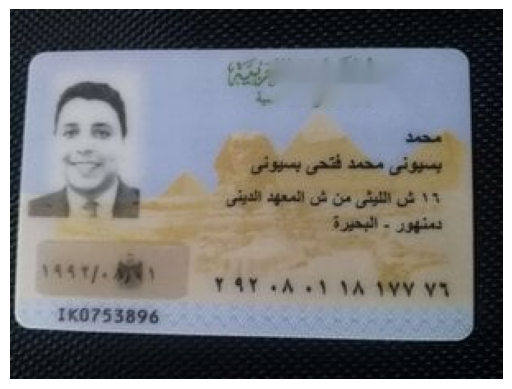

[INFO] OCR'ing input image...
[INFO] 0.0391: همهوزنذفصرالع بينما
[INFO] 0.1307: اطالا خند
[INFO] 0.6666: عبدالر
[INFO] 0.2222: كمر عنان زانر
[INFO] 0.4409: مركز زفتى  اللزببة
[INFO] 0.3034: ٩ ٢ ٢ ٣
[INFO] 0.7277: ٤68748359


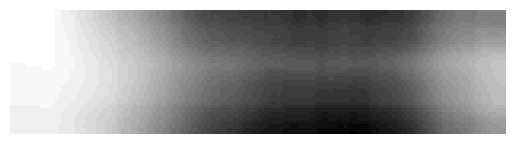

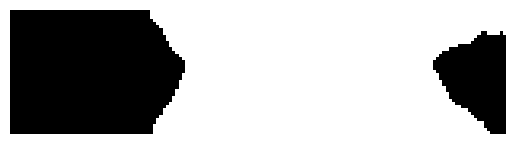

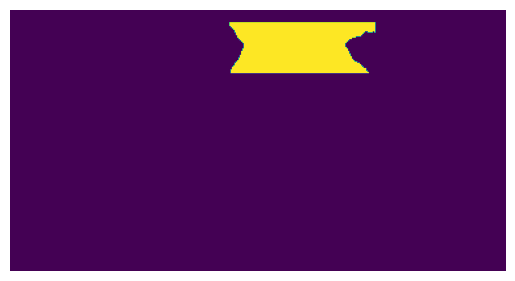

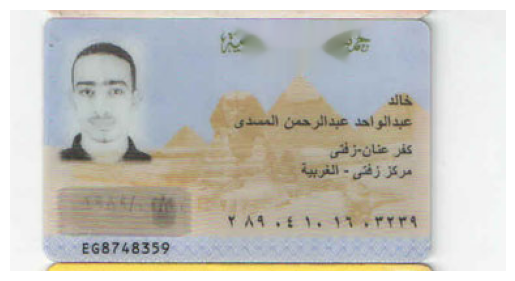

[INFO] OCR'ing input image...
[INFO] 0.2015: جمهورتذف صزالح بينا
[INFO] 0.9027: الشخصية
[INFO] 0.8070: بطاقة
[INFO] 0.9253: محمود
[INFO] 0.6756: محمد
[INFO] 0.6668: عبدالعزيز قطب
[INFO] 0.7693: الحكماء
[INFO] 0.7562: عبدالقادر
[INFO] 0.4069: ٩ ش
[INFO] 0.9988: الشرقية
[INFO] 0.8911: الزقازيق
[INFO] 0.1303: ٣٧٩؛ ٩٨٩١٠ ١
[INFO] 0.9955: ٨٩ ٢
[INFO] 0.7420: ١٣ ٠٩ ٠٩
[INFO] 0.8137: ٩٥ ٠٥
[INFO] 0.9825: 6$6787688
[INFO] 0.8802: تحقيق
[INFO] 0.7110: عصام
[INFO] 0.9808: ثان


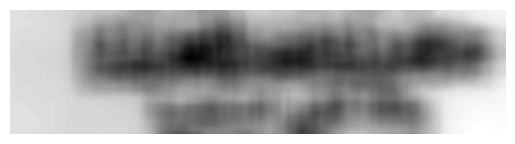

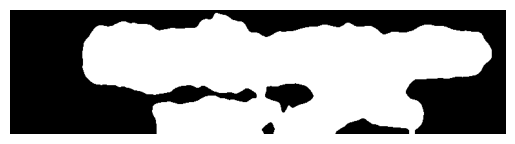

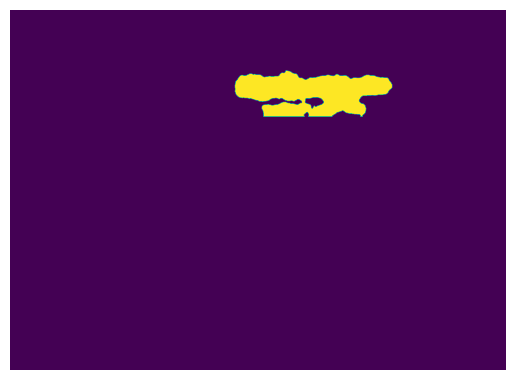

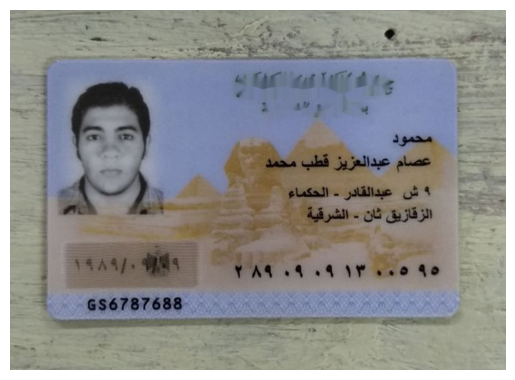

[INFO] OCR'ing input image...
[INFO] 0.0786: جمهوزنذهالع نبينما
[INFO] 0.0933: بااقآة
[INFO] 0.0061: لر
[INFO] 0.0023: قت
[INFO] 0.7935: همام
[INFO] 0.0493: يزسذ
[INFO] 0.7864: اش باب الشعرية
[INFO] 0.6295: الشرقية
[INFO] 0.9463: ثان
[INFO] 0.3706: ٠ ١ ٤ ٩ ٩ ١
[INFO] 0.0068: والكرء
[INFO] 0.1353: <110844395
[INFO] 0.1552: اتحقيق
[INFO] 0.1401: التمته بة
[INFO] 0.9578: السيد
[INFO] 0.7246: شىعبان
[INFO] 0.7113: الزقازيق


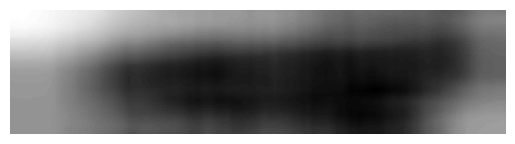

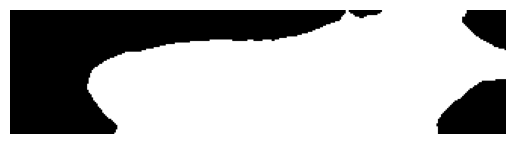

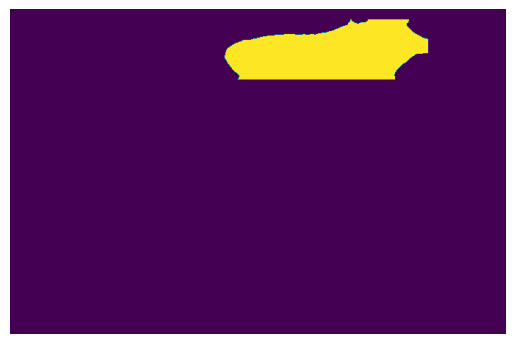

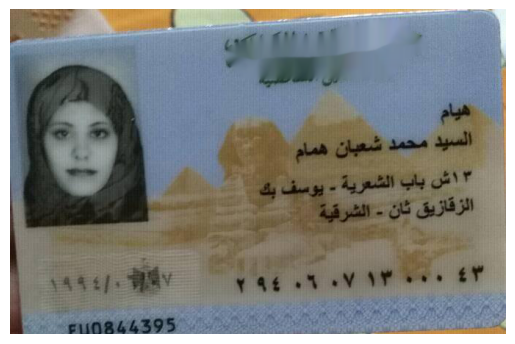

[INFO] OCR'ing input image...
[INFO] 0.0863: جمهوزئزقضزالح :
[INFO] 0.3228: الشخصية
[INFO] 0.2782: ابطاقة
[INFO] 0.0234: حا
[INFO] 0.2837: مدمد
[INFO] 0.8540: خالا
[INFO] 0.6595: كلا حين
[INFO] 0.7342: قنا
[INFO] 0.4008: مركز قنا
[INFO] 0.4717: ٢ ٥ ٦ ١ ٠
[INFO] 0.7931: 6"1346493
[INFO] 0.6163:  تحقيق
[INFO] 0.9744: ابنود


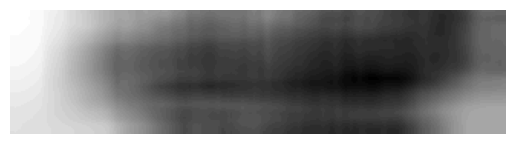

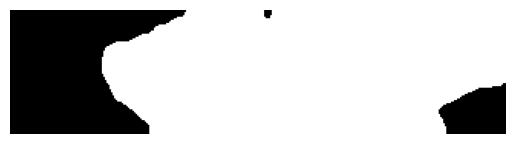

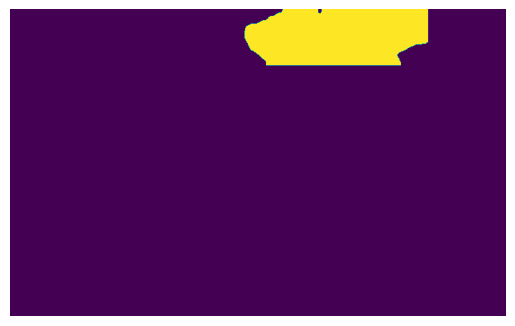

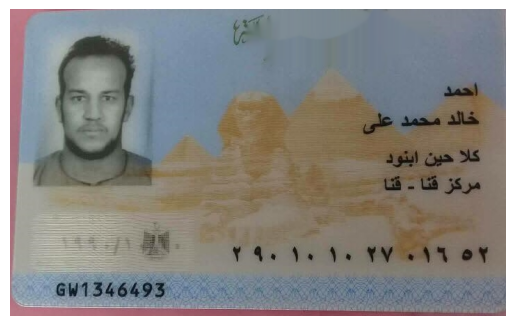

[INFO] OCR'ing input image...
[INFO] 0.0155: ل8 وزرز عبم ٦
[INFO] 0.1088: طاقتغتز
[INFO] 0.2750: أبراهيم على
[INFO] 0.1873: انبران
[INFO] 0.2110: مركز قنط - تا
[INFO] 0.6662: HK3077534


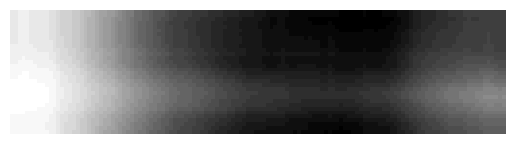

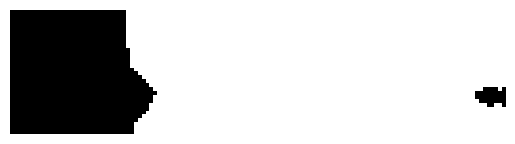

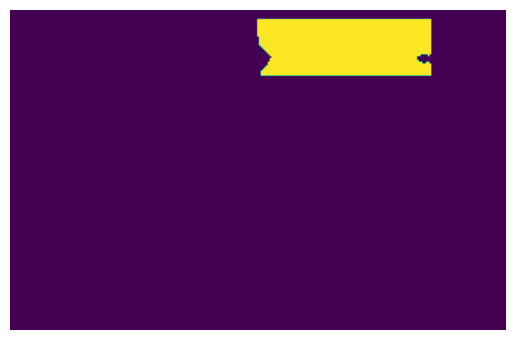

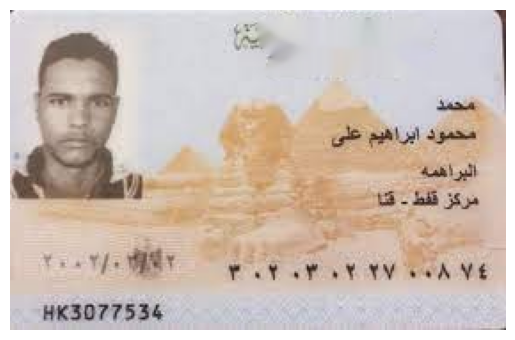

[INFO] OCR'ing input image...
[INFO] 0.0405: جمهوزنذف صم الع بينما
[INFO] 0.1525: الشحصية
[INFO] 0.3496: رطاؤة
[INFO] 0.9023: محمد السيد
[INFO] 0.4927: عبل
[INFO] 0.6475: عزبة المهاجرين
[INFO] 0.8557: الاسكندرية
[INFO] 0.7550: المنتزه
[INFO] 0.3433: ٩٧٠/١
[INFO] 0.9322: ٧
[INFO] 0.6504: ٧١ ٢٠
[INFO] 0.2152: 5865?5226
[INFO] 0.1674: نحقبق
[INFO] 0.9930: المنعم


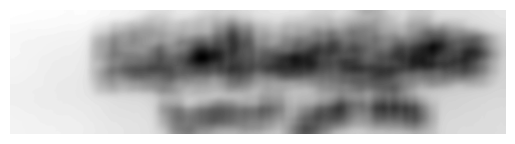

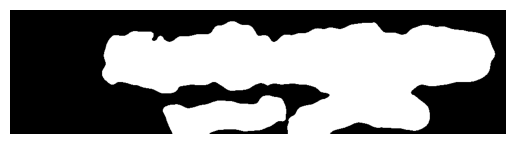

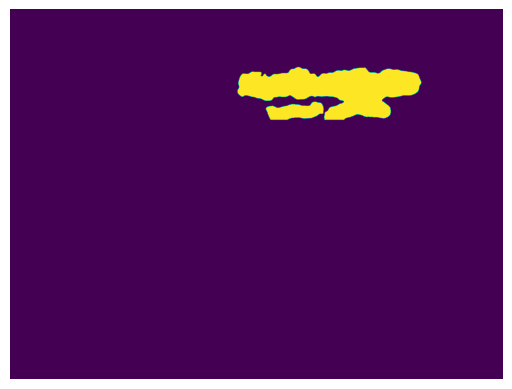

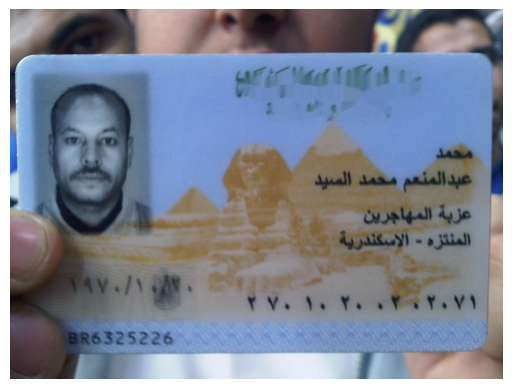

[INFO] OCR'ing input image...
[INFO] 0.0794: جمهوائذفوصنالح بينا
[INFO] 0.9519: الشخصية
[INFO] 0.9979: بطاقة
[INFO] 0.3070: احمد
[INFO] 0.5705: حسن شاهين
[INFO] 0.4785: حسين عواض
[INFO] 0.4149: الفولى من بن واصل
[INFO] 0.8458: و
[INFO] 0.8646: نهاية
[INFO] 0.7541: الاسكندرية
[INFO] 0.8777: ثان الرمل
[INFO] 0.4827: ٤٢١٨ ٢١٠ ٩ ٩ ١
[INFO] 0.9674: ٠٤ ٩٢ ٢
[INFO] 0.9851: ٩٥ ٩
[INFO] 0.9145: 615596410
[INFO] 0.7585: تحقيق
[INFO] 0.9980: ابور


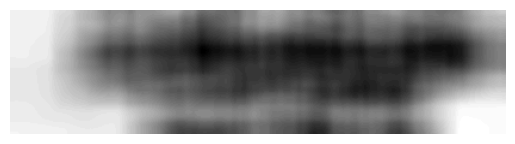

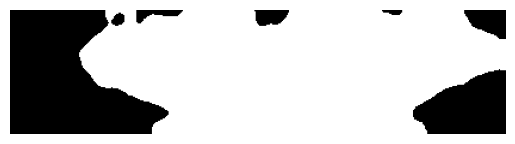

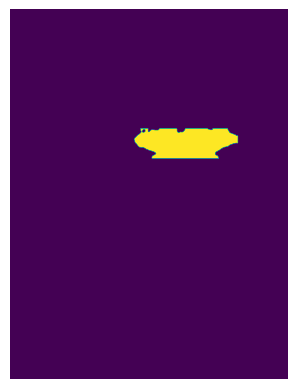

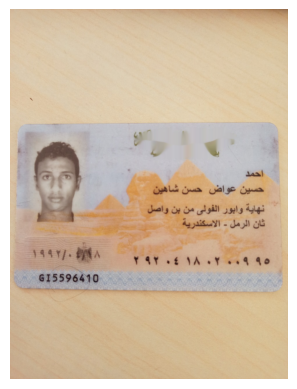

[INFO] OCR'ing input image...
[INFO] 0.0667: جمهوذتينزف صزالح بيننا
[INFO] 0.9549: الشخصية
[INFO] 0.9996: بطاقة
[INFO] 0.9358: الله
[INFO] 0.7456: محمد ابرا هيم
[INFO] 0.9050: القلج البلد
[INFO] 0.5661: القليوبية
[INFO] 0.6939: مركز الخانكه
[INFO] 0.7664: ٩٨ ٢
[INFO] 0.7522: ٨٨ ٠٣ ٠٧
[INFO] 0.9999: ٧٨
[INFO] 0.4833: |A5778064
[INFO] 0.2936: تحقيق
[INFO] 0.9834: مصطفى
[INFO] 0.9049: فتح
[INFO] 0.9990: ابراهيم


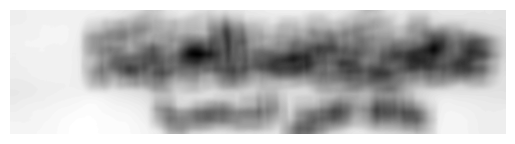

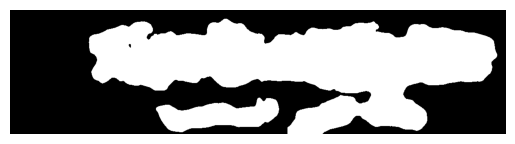

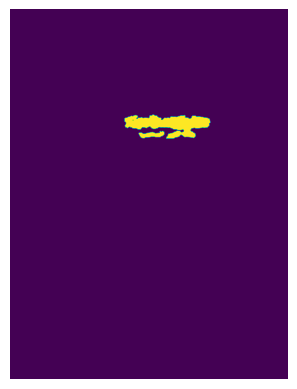

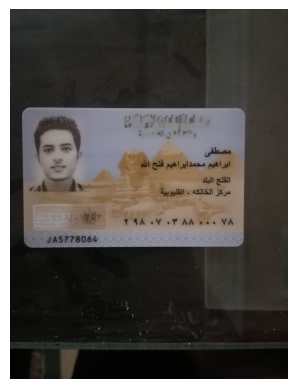

In [11]:
folder = "/content/input"

for item in os.listdir(folder):
    full_path = os.path.join(folder, item)
    if os.path.isfile(full_path):
        results = arabicocr.arabic_ocr(full_path, 'out.jpg')
        points = results[0][0]
        # Extract the second and third points
        second_point = results[0][0][1]
        third_point = results[1][0][2]

        # Calculate vertical distance between the second and third points
        vertical_distance = abs(third_point[1] - second_point[1])

        # Calculate coordinates for the top-left and bottom-right corners of the bounding box
        x0, y0 = (int(second_point[0] - 4 * vertical_distance), second_point[1])
        x2, y2 = (second_point[0], third_point[1])
        x1, y1 = second_point
        x3, y3 = (x0, y2)

        x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
        x_mid1, y_mid1 = midpoint(x0, y0, x3, y3)

        # Read the image
        image = cv2.imread(full_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = np.zeros(image.shape[:2], dtype="uint8")

        # Extract the region of interest (ROI)
        roi = image[y0:y2, x0:x2]
        grayImg = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        blurred = cv2.blur(grayImg, (50 , 50))
        ret, thresh_img = cv2.threshold(blurred, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)
        mask[y0:y2, x0:x2] = thresh_img


        inpainted_image = cv2.inpaint(image, mask, 100 , cv2.INPAINT_NS)
        # Show the inpainted image
        display_image(blurred, 'gray')
        display_image(thresh_img, 'gray')
        display_image(mask)
        display_image(inpainted_image)


### SIFT Experiments

Since actually in this speceic problem, we know the exact word that we expect to see in each image, we can use SIFT to match the image of the logo inside the image itself.

- Use SIFT to match the logo inside the ID and return the bounding box

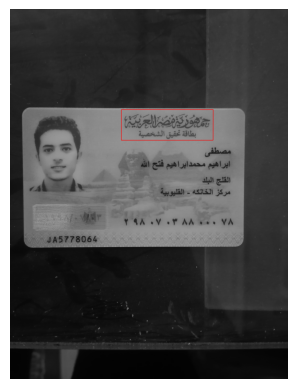

In [10]:
# Load the image and the logo that we want to match
object_image = cv2.imread('/content/Logo.PNG', cv2.IMREAD_GRAYSCALE)
scene_image = cv2.imread('/content/input/44.jpg', cv2.IMREAD_GRAYSCALE)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

# Match descriptors using FLANN matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

# Apply ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

if len(good_matches) > 10:
    # Extract location of good matches
    src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
    dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

    # Find homography
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Get the corners from the object image
    h, w = object_image.shape
    corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

    # Transform corners to scene image
    transformed_corners = cv2.perspectiveTransform(corners, M)

    # Draw bounding box in the scene image
    scene_image = cv2.cvtColor(scene_image, cv2.COLOR_BGR2RGB)
    scene_image_with_bbox = cv2.polylines(scene_image.copy(), [np.int32(transformed_corners)], True, 255, 3, cv2.LINE_AA)

    # display the result
    display_image(scene_image_with_bbox)


else:
    print("Not enough matches found - {}/{}".format(len(good_matches), 10))


- This is a very promising result. As can be seen, the logo was fully detected. We can try the rest of the images while moving on to the inpainting part to see the quality of the output.


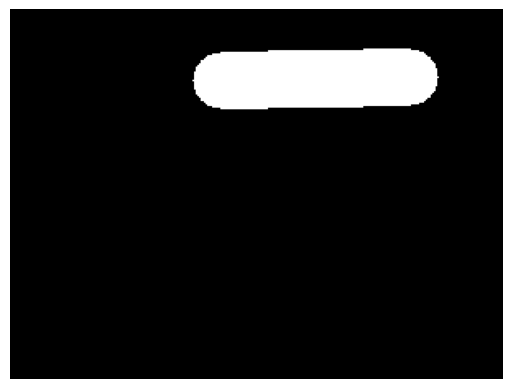

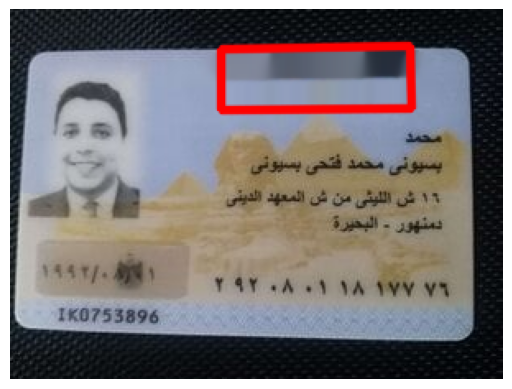

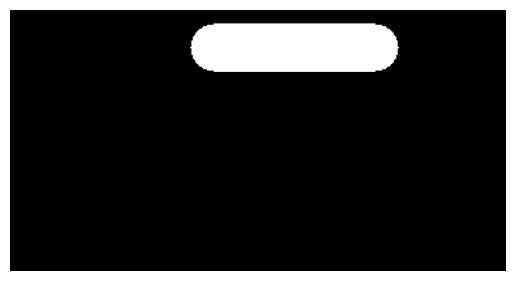

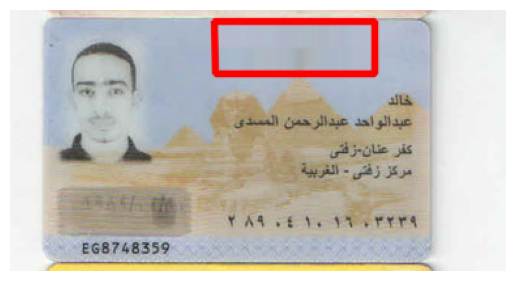

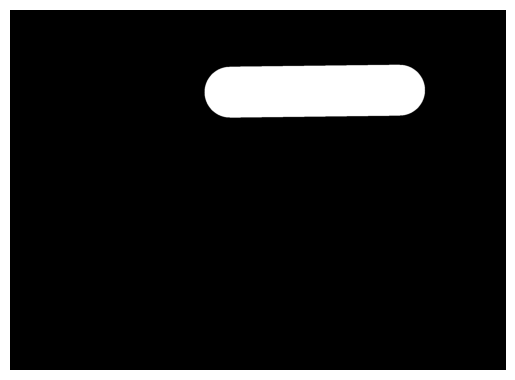

...

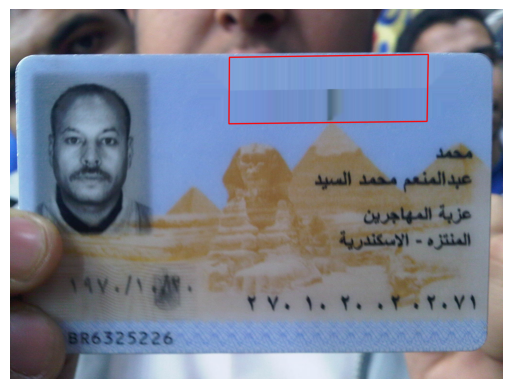

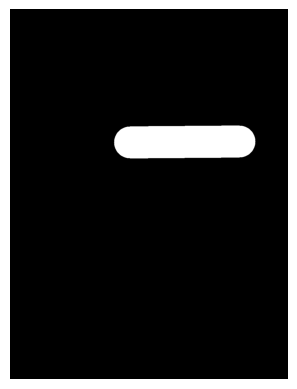

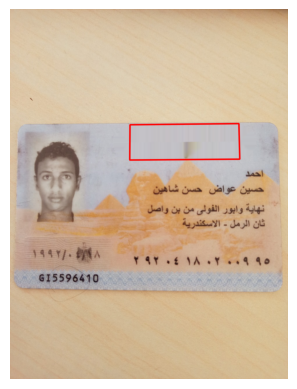

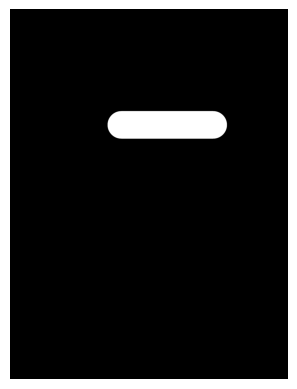

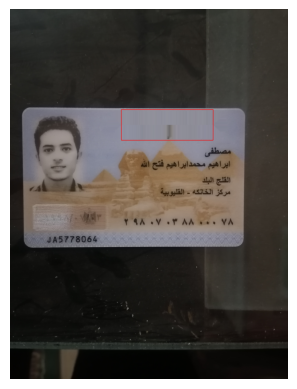

In [12]:
# Path to the folder containing images
folder_path = "/content/input"

# Loop over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the object image
        object_image = cv2.imread('/content/Logo.PNG', cv2.IMREAD_GRAYSCALE)

        # Load the scene image
        scene_image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)

        # Initialize SIFT detector
        sift = cv2.SIFT_create()

        # Detect keypoints and compute descriptors
        keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
        keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

        # Match descriptors using FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        if len(good_matches) > 10:
            # Extract location of good matches
            src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
            dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

            # Find homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Get the corners from the object image
            h, w = object_image.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

            # Transform corners to scene image
            transformed_corners = cv2.perspectiveTransform(corners, M)

            # Calculate coordinates for the top-left and bottom-right corners of the bounding box
            x0, y0 = transformed_corners[0][0]
            x1, y1 = transformed_corners[1][0]
            x2, y2 = transformed_corners[2][0]
            x3, y3 = transformed_corners[3][0]

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            # Read scene image again and convert to RGB
            image = cv2.imread(os.path.join(folder_path, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = np.zeros(image.shape[:2], dtype="uint8")

            thickness = int(math.sqrt((x2 - x1)**2 + (y2 - y1)**2)- math.sqrt( (x2 - x1)**2 + (y2 - y1)**2) * 0.1)
            cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mi1), 255, thickness)

            image = cv2.inpaint(image, mask, 7, cv2.INPAINT_NS)

            # Draw bounding box on the inpainted image using individual corner coordinates
            scene_image_with_bbox = image.copy()
            cv2.polylines(scene_image_with_bbox, [np.array([(x0, y0), (x1, y1), (x2, y2), (x3, y3)], dtype=np.int32)], True, 255, 3, cv2.LINE_AA)

            # Show the inpainted image
            display_image(mask, 'gray')
            display_image(scene_image_with_bbox)




- The logo was successfully detected in all of the images. However, during inpainting, the background interfered in some of the images. So, we can try with a smaller logo template or try another inpainting method. I am going both direction and comparing the results.

#### Trying a smaller logo

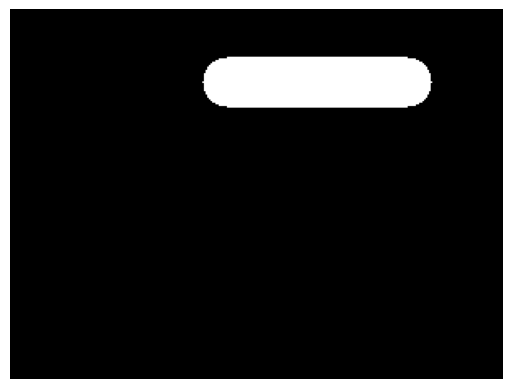

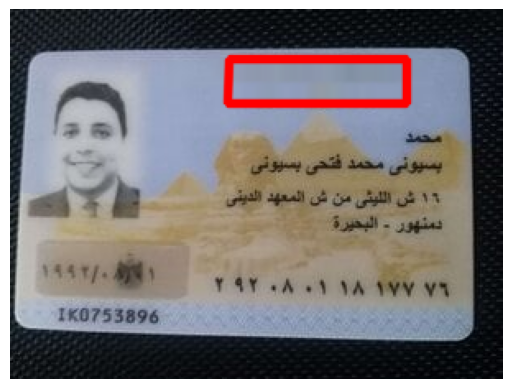

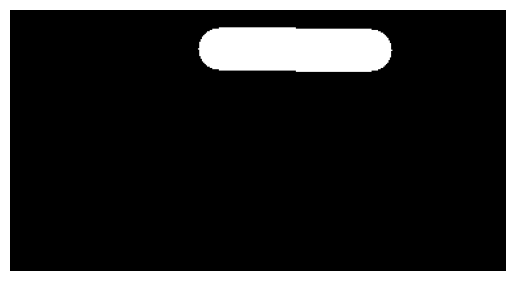

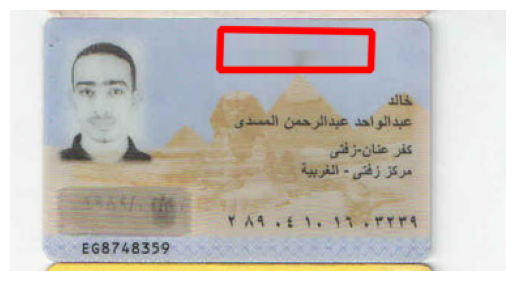

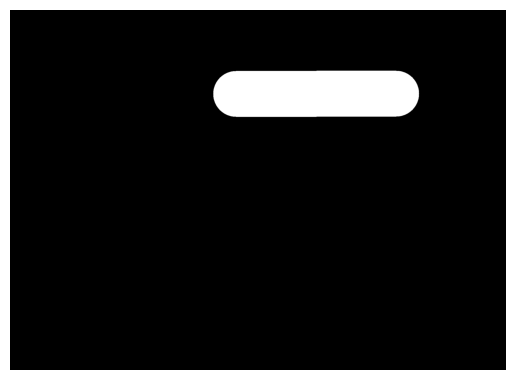

...

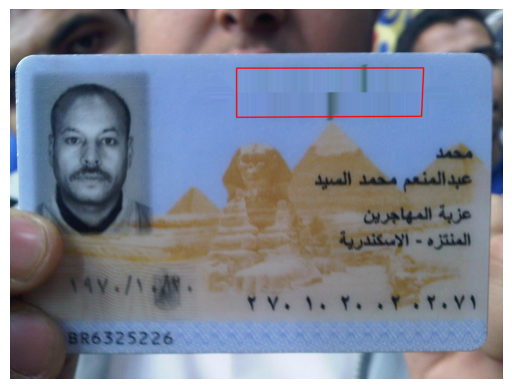

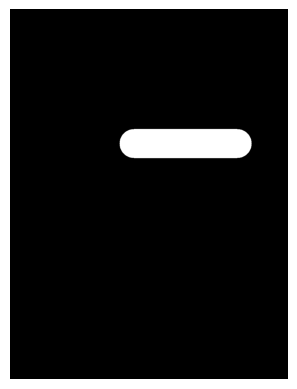

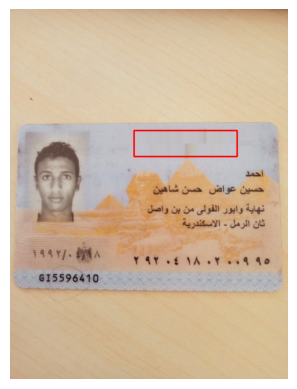

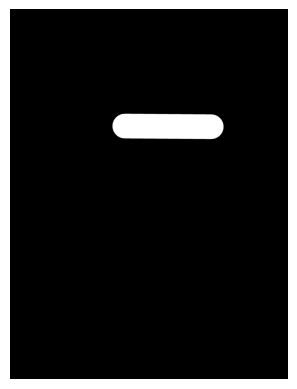

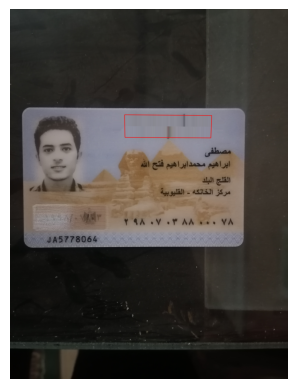

In [13]:
# Path to the folder containing images
folder_path = "/content/input"

# Loop over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the object image
        object_image = cv2.imread('/content/Logo_2.PNG', cv2.IMREAD_GRAYSCALE)

        # Load the scene image
        scene_image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)

        # Initialize SIFT detector
        sift = cv2.SIFT_create()

        # Detect keypoints and compute descriptors
        keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
        keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

        # Match descriptors using FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        if len(good_matches) > 10:
            # Extract location of good matches
            src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
            dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

            # Find homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Get the corners from the object image
            h, w = object_image.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

            # Transform corners to scene image
            transformed_corners = cv2.perspectiveTransform(corners, M)

            # Calculate coordinates for the top-left and bottom-right corners of the bounding box
            x0, y0 = transformed_corners[0][0]
            x1, y1 = transformed_corners[1][0]
            x2, y2 = transformed_corners[2][0]
            x3, y3 = transformed_corners[3][0]

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            # Read scene image again and convert to RGB
            image = cv2.imread(os.path.join(folder_path, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = np.zeros(image.shape[:2], dtype="uint8")

            thickness = int(math.sqrt((x2 - x1)**2 + (y2 - y1)**2) + math.sqrt( (x2 - x1)**2 + (y2 - y1)**2) * 0.1)
            cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mi1), 255, thickness)

            image = cv2.inpaint(image, mask, 7, cv2.INPAINT_NS)

            # Draw bounding box on the inpainted image using individual corner coordinates
            scene_image_with_bbox = image.copy()
            cv2.polylines(scene_image_with_bbox, [np.array([(x0, y0), (x1, y1), (x2, y2), (x3, y3)], dtype=np.int32)], True, 255, 3, cv2.LINE_AA)

            # Show mask and image
            display_image(mask, 'gray')
            display_image(scene_image_with_bbox)



- The homogenity of the color is better here compared to the larger Logo, so we are going to go with this template.

#### Trying thresholding

- I am going to try to remove the green pixels by working on the bounding box area only. I will then convert to grayscale, apply binary thresholding, and invert the colors to get a mask for the logo. Then, I will fill those pixels with the average of the two corners and apply some smoothing (blurring) to see the results.

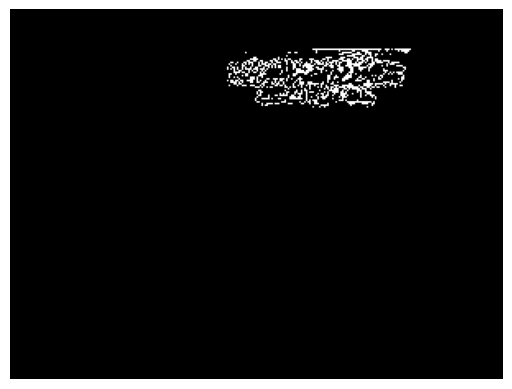

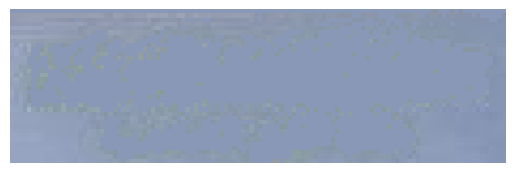

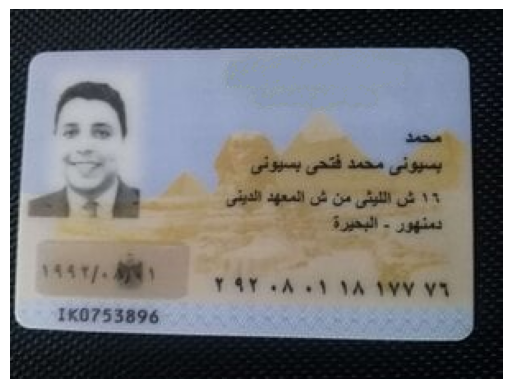

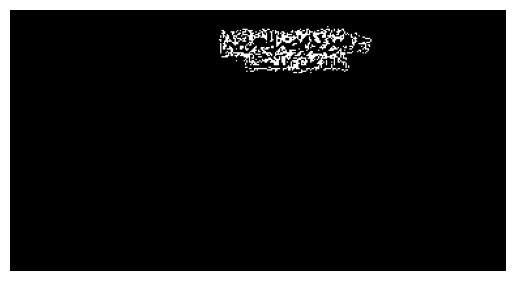

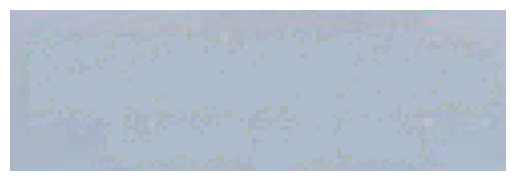

...

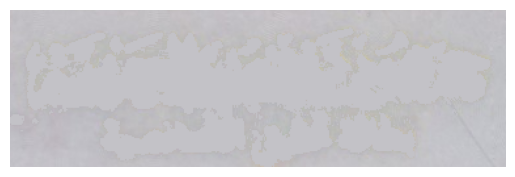

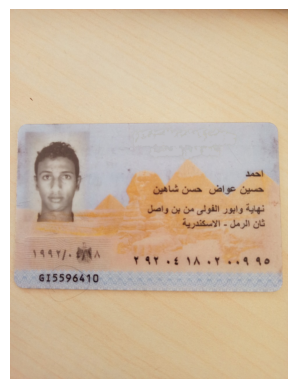

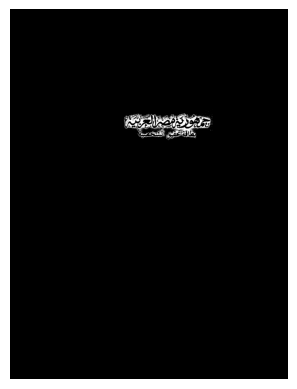

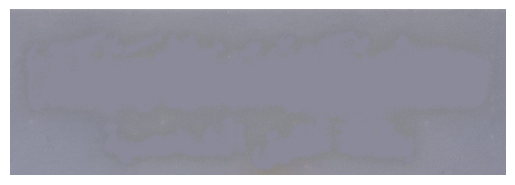

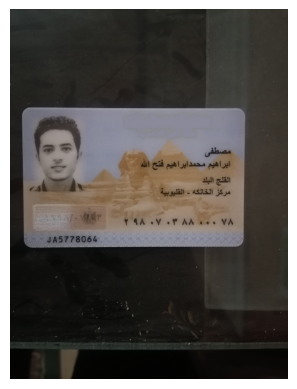

In [14]:
# Path to the folder containing images
folder_path = "/content/input"

# Loop over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the object image
        object_image = cv2.imread('/content/Logo.PNG', cv2.IMREAD_GRAYSCALE)

        # Load the scene image
        scene_image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)

        # Initialize SIFT detector
        sift = cv2.SIFT_create()

        # Detect keypoints and compute descriptors
        keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
        keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

        # Match descriptors using FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        if len(good_matches) > 10:
            # Extract location of good matches
            src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
            dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

            # Find homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Get the corners from the object image
            h, w = object_image.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

            # Transform corners to scene image
            transformed_corners = cv2.perspectiveTransform(corners, M)

            # Calculate coordinates for the top-left and bottom-right corners of the bounding box
            x0, y0 = transformed_corners[0][0]
            x1, y1 = transformed_corners[1][0]
            x2, y2 = transformed_corners[2][0]
            x3, y3 = transformed_corners[3][0]

            # Ensuring that non of the values are negative
            x0 = max(x0 , 0); x1 = max(x1,0); x2 = max(x2,0); x3 = max(x3,0)
            y0 = max(y0 , 0); y1 = max(y1,0); y2 = max(y2,0); y3 = max(y3,0)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            # Read scene image again and convert to RGB
            image = cv2.imread(os.path.join(folder_path, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = np.zeros(image.shape[:2], dtype="uint8")

            for i in range(0,2):
                roi = image[int(y0):int(y2), int(x0):int(x2)]
                #roi = cv2.blur(roi, (15 , 15))
                grayImg = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
                ret, thresh_img = cv2.threshold(grayImg, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

                mask_indices = np.where(thresh_img == 255)
                roi[mask_indices] = ((image[int(y2) , int(x2)]))
            #roi = cv2.blur(roi, (9 , 9))
            image[int(y0):int(y2), int(x0):int(x2)] = roi
            mask[int(y0):int(y2), int(x0):int(x2)]  = thresh_img


            # Show mask and image
            display_image(mask, 'gray')
            display_image(roi)
            display_image(image)



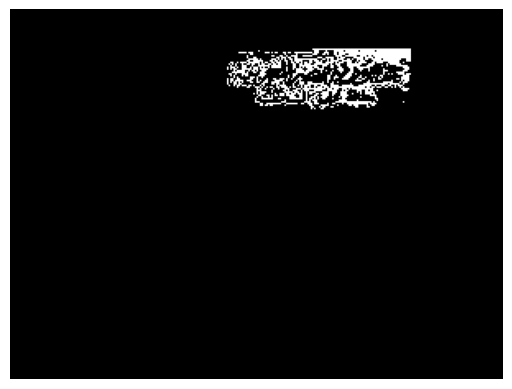

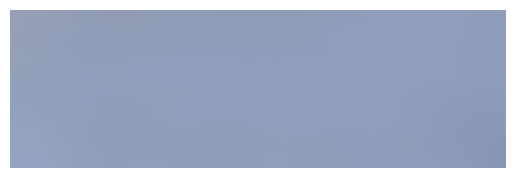

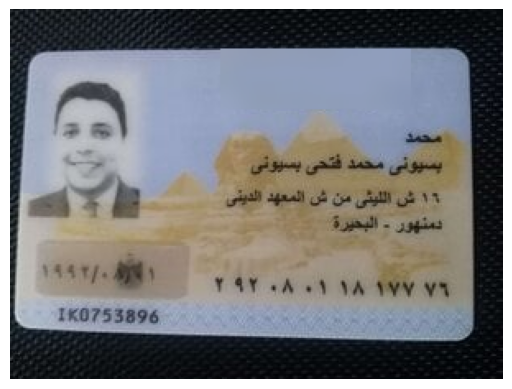

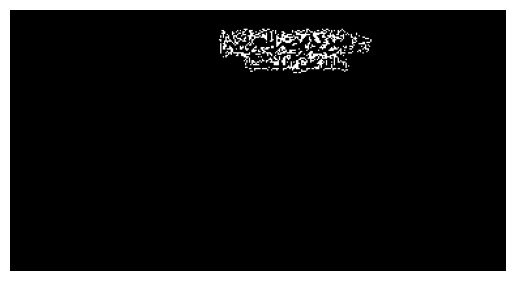

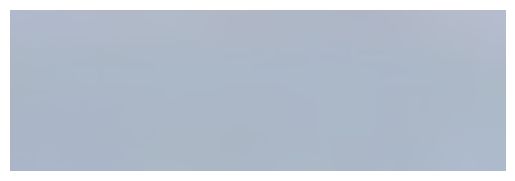

...

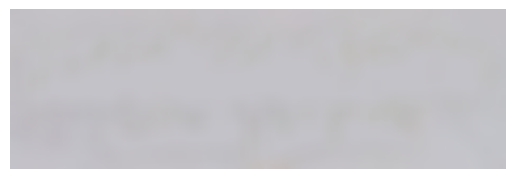

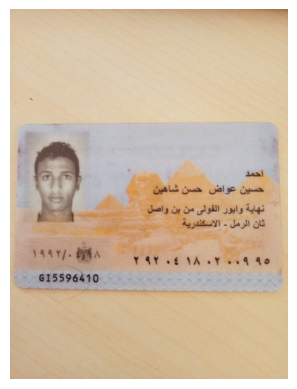

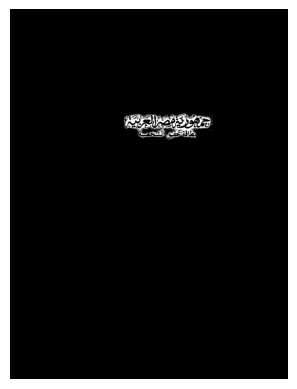

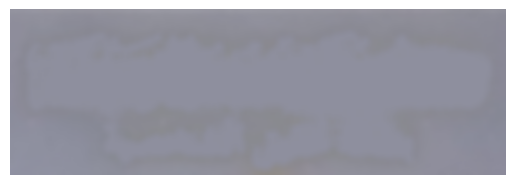

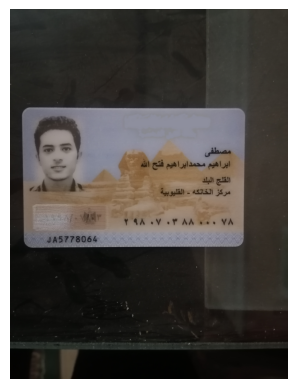

In [15]:
# Path to the folder containing images
folder_path = "/content/input"

# Loop over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the object image
        object_image = cv2.imread('/content/Logo.PNG', cv2.IMREAD_GRAYSCALE)

        # Load the scene image
        scene_image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)

        # Initialize SIFT detector
        sift = cv2.SIFT_create()

        # Detect keypoints and compute descriptors
        keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
        keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

        # Match descriptors using FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        if len(good_matches) > 10:
            # Extract location of good matches
            src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
            dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

            # Find homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Get the corners from the object image
            h, w = object_image.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

            # Transform corners to scene image
            transformed_corners = cv2.perspectiveTransform(corners, M)

            # Calculate coordinates for the top-left and bottom-right corners of the bounding box
            x0, y0 = transformed_corners[0][0]
            x1, y1 = transformed_corners[1][0]
            x2, y2 = transformed_corners[2][0]
            x3, y3 = transformed_corners[3][0]

            # Ensuring that non of the values are negative
            x0 = max(x0 , 0); x1 = max(x1,0); x2 = max(x2,0); x3 = max(x3,0)
            y0 = max(y0 , 0); y1 = max(y1,0); y2 = max(y2,0); y3 = max(y3,0)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            # Read scene image again and convert to RGB
            image = cv2.imread(os.path.join(folder_path, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = np.zeros(image.shape[:2], dtype="uint8")

            x_0 = int(min(x0,x3))
            y_0 = int(min(y0,y1))
            x_2 = int(max(x1,x2))
            y_2 = int(max(y3,y2))

            # applying thresholding and blurring
            for i in range(0,2):
                roi = image[int(y0):y_2, int(x0):x_2]
                #roi = cv2.blur(roi, (15 , 15))
                grayImg = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
                ret, thresh_img = cv2.threshold(grayImg, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

                mask_indices = np.where(thresh_img == 255)
                avg_pixel_value = ((image[int(y2), int(x2)].astype(np.int32) + image[int(y2), int(x0)].astype(np.int32)) // 2).astype(np.uint8)

                roi[mask_indices] = avg_pixel_value
            roi = cv2.blur(roi, (15, 15))
            # calculte coordinates for
            image[int(y0):y_2, int(x0):x_2] = roi
            mask[int(y0):y_2, int(x0):x_2]  = thresh_img

            # Show mask and image
            display_image(mask, 'gray')

            display_image(roi)
            display_image(image)

        else:
            print("Not enough Matches found")


- Applying thresholding on the logo area and filling with the average of the bottom corners only works well for lighter backgrounds, even though we've tried different blurring functions and applied it for two iterations.


- Trying histogram equalization

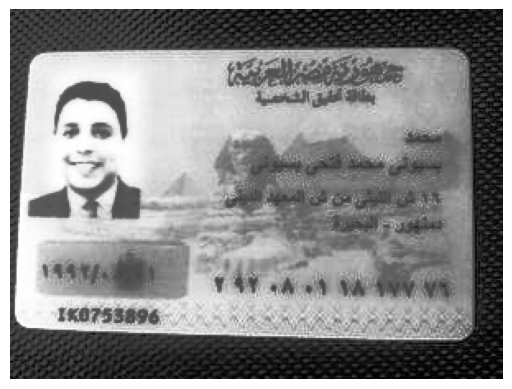

In [29]:
image = cv2.imread('/content/input/15.jpg', cv2.IMREAD_GRAYSCALE)
display_image(cv2.equalizeHist(image), cmap = 'gray')

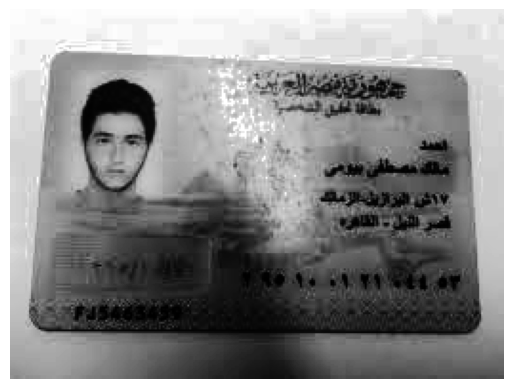

In [31]:
image = cv2.imread('/content/input2/42.jpg', cv2.IMREAD_GRAYSCALE)
display_image(cv2.equalizeHist(image), cmap = 'gray')

In [30]:
# Path to the folder containing images
folder_path = "/content/input2"

# Loop over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the object image
        object_image = cv2.imread('/content/Logo_2.PNG', cv2.IMREAD_GRAYSCALE)

        # Load the scene image
        scene_image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
        scene_image = cv2.equalizeHist(scene_image)
        # Initialize SIFT detector
        sift = cv2.SIFT_create()

        # Detect keypoints and compute descriptors
        keypoints_obj, descriptors_obj = sift.detectAndCompute(object_image, None)
        keypoints_scene, descriptors_scene = sift.detectAndCompute(scene_image, None)

        # Match descriptors using FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_obj, descriptors_scene, k=2)

        # Apply ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)

        if len(good_matches) > 10:
            # Extract location of good matches
            src_pts = np.float32([keypoints_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
            dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)

            # Find homography
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Get the corners from the object image
            h, w = object_image.shape
            corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)

            # Transform corners to scene image
            transformed_corners = cv2.perspectiveTransform(corners, M)

            # Calculate coordinates for the top-left and bottom-right corners of the bounding box
            x0, y0 = transformed_corners[0][0]
            x1, y1 = transformed_corners[1][0]
            x2, y2 = transformed_corners[2][0]
            x3, y3 = transformed_corners[3][0]

            # Ensuring that non of the values are negative
            x0 = max(x0 , 0); x1 = max(x1,0); x2 = max(x2,0); x3 = max(x3,0)
            y0 = max(y0 , 0); y1 = max(y1,0); y2 = max(y2,0); y3 = max(y3,0)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
            x_mid1, y_mi1 = midpoint(x0, y0, x3, y3)

            # Read scene image again and convert to RGB
            image = cv2.imread(os.path.join(folder_path, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = np.zeros(image.shape[:2], dtype="uint8")

            x_0 = int(min(x0,x3))
            y_0 = int(min(y0,y1))
            x_2 = int(max(x1,x2))
            y_2 = int(max(y3,y2))

            # applying thresholding and blurring
            for i in range(0,2):
                roi = image[int(y0):y_2, int(x0):x_2]
                #roi = cv2.blur(roi, (15 , 15))
                grayImg = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
                ret, thresh_img = cv2.threshold(grayImg, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

                mask_indices = np.where(thresh_img == 255)
                avg_pixel_value = ((image[int(y2), int(x2)].astype(np.int32) + image[int(y2), int(x0)].astype(np.int32)) // 2).astype(np.uint8)

                roi[mask_indices] = avg_pixel_value
            roi = cv2.blur(roi, (15, 15))
            # calculte coordinates for
            image[int(y0):y_2, int(x0):x_2] = roi
            mask[int(y0):y_2, int(x0):x_2]  = thresh_img
            #display_image(image)
        else:
            print("Not enough Matches found")


Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found
Not enough Matches found


- Some of the IDs were not detected with the smaller logo and trying to normalize the image did not help. So, we are just going to use a larger logo so more matches can be found.

Conclusion:
- SIFT has proven to be the best method for detection.
- cv2.inpaint() is the best method for inpainting and replacing the logo.

### Resources:


- https://pypi.org/project/ArabicOcr/#description
- https://keras-ocr.readthedocs.io/en/latest/examples/fine_tuning_recognizer.html
- https://docs.opencv.org/3.4/df/d3d/tutorial_py_inpainting.html
- https://www.kaggle.com/datasets/mostafaebrahiem/egyptian-ids?select=data_set
- https://sanaazahra.medium.com/ocr-segmentation-with-python-code-f3251114ee48
- https://khandelwal-shekhar.medium.com/arabicocr-amazing-ocr-library-for-arabic-pdf-documents-5d736e97904b
- https://bhadreshpsavani.medium.com/how-to-use-tesseract-library-for-ocr-in-google-colab-notebook-5da5470e4fe0
- https://towardsdatascience.com/remove-text-from-images-using-cv2-and-keras-ocr-24e7612ae4f4